In [1]:
import numpy as np
from sklearn.datasets import make_classification
X,y = make_classification(n_samples = 100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=12)

In [2]:
X

array([[ 0.26164425, -0.11697552],
       [-0.18642349, -0.73115232],
       [-0.2920936 , -0.7081059 ],
       [-1.93052343, -2.01199214],
       [-0.1384427 ,  1.63493163],
       [-1.17206959,  0.15599044],
       [-2.13172851,  1.07782053],
       [ 0.1480575 ,  0.80626713],
       [-0.49625619,  0.74859527],
       [-2.29940099,  0.75152794],
       [-2.11794784, -0.90114581],
       [-2.1195169 , -0.1815243 ],
       [ 0.04045529, -2.98092432],
       [ 0.86803111,  1.20500136],
       [-2.16667051,  0.78302407],
       [ 0.44970408,  0.42968688],
       [-0.07868988, -0.73229726],
       [-2.21921777, -0.83930476],
       [-0.11993231,  0.83727062],
       [-2.1102537 , -0.10255323],
       [-2.61623865,  0.65867001],
       [-2.40485339,  0.92649819],
       [-1.65656388,  0.10216193],
       [ 1.67282939,  0.46886454],
       [-1.55616231,  0.45432938],
       [ 0.6763691 ,  1.8613386 ],
       [-2.12726793, -0.79255991],
       [-1.38114998, -1.0004391 ],
       [-2.7403342 ,

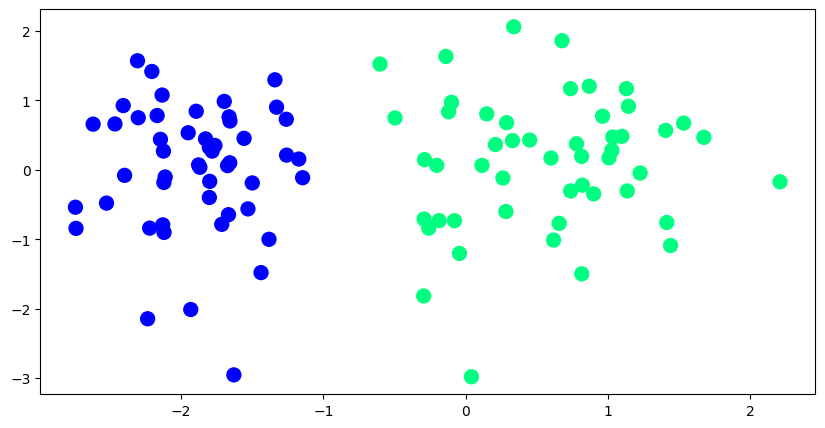

In [3]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,5))
plt.scatter(X[:,0],X[:,1], c=y, cmap="winter", s=100)
plt.show()

In [4]:
def perceptron(X,y):
    X =  np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.01
    n_epochs=100
    for i in range(n_epochs):
        j = np.random.randint(0,100)
        yhat = step(np.dot(X[j],weights))
        weights = weights + (y[j] - yhat) * X[j]

    return weights[0], weights[1:]


In [5]:
def step(z):
    return 1 if z>0 else 0 

In [6]:
intercept_, coef_ = perceptron(X,y)
print(intercept_)
print(coef_)

2.0
[1.76160744 1.11246204]


In [7]:
# Lets find slope and intercept
m = -(coef_[0] / coef_[1])
b = - (intercept_/ coef_[1])
print("m=",m)
print("b= ",b)



m= -1.5835213910305186
b=  -1.7978141541952894


In [8]:
x_input = np.linspace(-3,3,100)
y_input = m * x_input + b

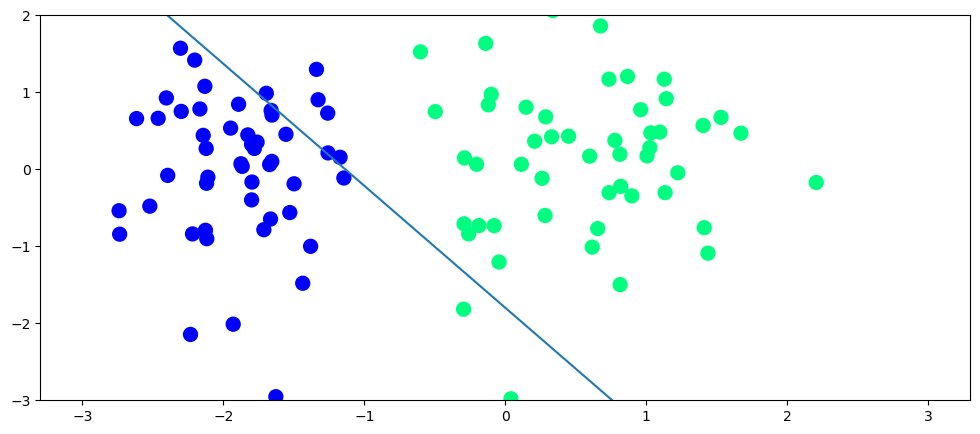

In [9]:
plt.figure(figsize=(12,5))
plt.plot(x_input,y_input)
plt.scatter(X[:,0],X[:,1], c=y, cmap="winter",s=100)
plt.ylim(-3,2)
plt.show()

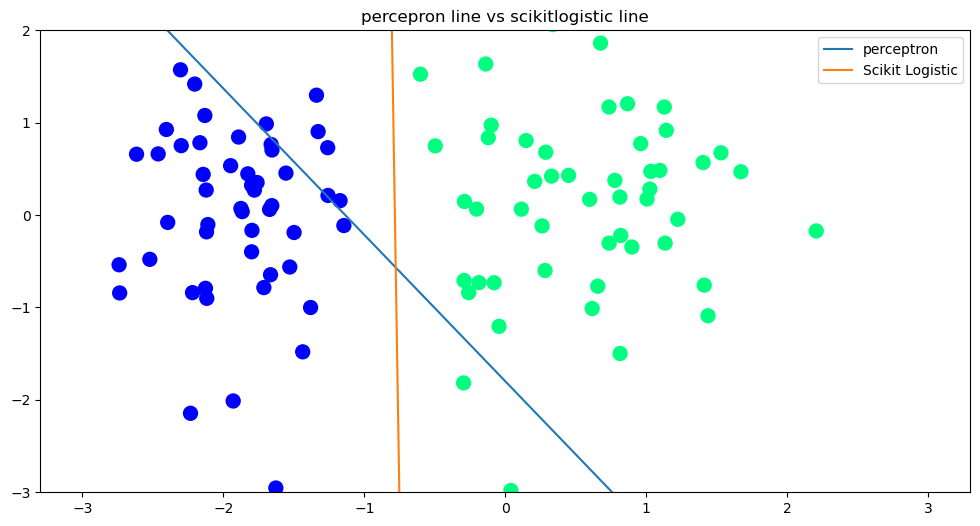

In [10]:
# lets check once from scikitlearn 
from sklearn.linear_model import LogisticRegression
lo_r = LogisticRegression()
lo_r.fit(X,y)

m = -(lo_r.coef_[0][0] / lo_r.coef_[0][1])
b = -(lo_r.intercept_ / lo_r.coef_[0][1])

x_input1= np.linspace(-3,3,100)
y_input1 = x_input*m + b

import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.plot(x_input,y_input, label = "perceptron")
plt.plot(x_input1,y_input1, label = "Scikit Logistic")
plt.scatter(X[:,0], X[:,1], c=y, cmap="winter", s=100)
plt.ylim(-3,2)
plt.title("percepron line vs scikitlogistic line")
plt.legend()
plt.show()

In [11]:
def perceptron1(X,y):
    m = []
    b = []
    X = np.insert(X,0,1, axis =1)
    weights = np.ones(X.shape[1])
    lr = 0.01
    n_epochs = 1000
    for epoch in range(n_epochs):
        j = np.random.randint(0,100)
        yhat = step(np.dot(X[j], weights))
        weights = weights + (y[j] - yhat)*X[j]

        m.append(-(weights[1] / weights[2]))
        b.append(-(weights[0] / weights[2]))

    return m ,b

In [12]:

m,b = perceptron1(X,y)

In [13]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i*m[0] +b[0]
ax.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
line, = ax.plot(x_i, x_i*m[0] +b[0] , 'r-', linewidth=2)
plt.ylim(-3,3)
def update(i):
    label = 'epoch {0}'.format(i + 1)
    line.set_ydata(x_i*m[i] + b[i])
    ax.set_xlabel(label)
    # return line, ax

anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)
HTML(anim.to_jshtml())


<IPython.core.display.Javascript object>

In [14]:
# lets check once from scikitlearn 
from sklearn.linear_model import LogisticRegression
lo_r = LogisticRegression()
lo_r.fit(X,y)

m = -(lo_r.coef_[0][0] / lo_r.coef_[0][1])
b = -(lo_r.intercept_ / lo_r.coef_[0][1])

x_input1= np.linspace(-3,3,100)
y_input1 = x_input*m + b

import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.plot(x_input,y_input, label = "perceptron")
plt.plot(x_input1,y_input1, label = "Scikit Logistic")
plt.scatter(X[:,0], X[:,1], c=y, cmap="winter", s=100)
plt.ylim(-3,2)
plt.title("percepron line vs scikitlogistic line")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>

In [15]:
m = -(lo_r.coef_[0][0] / lo_r.coef_[0][1])
b = -(lo_r.intercept_ / lo_r.coef_[0][1])

In [16]:
x_input1= np.linspace(-3,3,100)
y_input1 = x_input*m + b

In [17]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.plot(x_input,y_input, label = "perceptron")
plt.plot(x_input1,y_input1, label = "Scikit Logistic")
plt.scatter(X[:,0], X[:,1], c=y, cmap="winter", s=100)
plt.ylim(-3,2)
plt.title("percepron line vs scikitlogistic line")
plt.legend()
plt.show()

<IPython.core.display.Javascript object>